<a href="https://colab.research.google.com/github/PiyushGithub24/MACHINE_LEARNING_BY_PIYUSH_KUMAR/blob/main/Logistic_Regression_Perceptron_Trick.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from sklearn.datasets import  make_classification
import numpy as np
import matplotlib.pyplot as plt

In [2]:
X,y=make_classification(
    n_samples=100,n_features=2, n_informative=1, n_redundant=0, n_classes=2, n_clusters_per_class=1, random_state=41,
    hypercube=False, class_sep=20
    )

In [3]:
X.shape,y.shape

((100, 2), (100,))

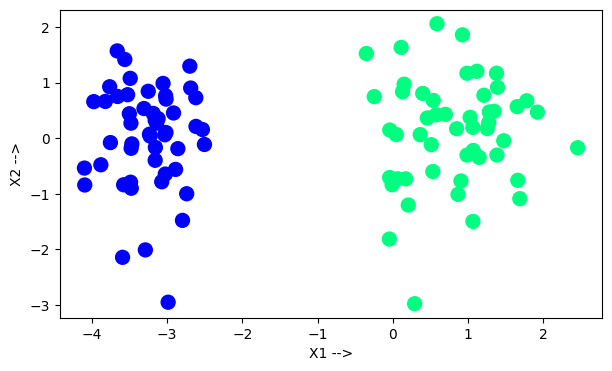

In [4]:
plt.figure(figsize=(7,4))
plt.scatter(X[:,0],X[:,1],c=y, cmap='winter',s=100)
plt.xlabel("X1 -->")
plt.ylabel("X2 -->")
plt.show()

In [5]:
def perceptron(X,y):
  X=np.insert(X,0,1,axis=1)         #adding a column of 1's in X as 1st column
  weights=np.ones(X.shape[1])       #initializing weights to 1
  lr=0.1

  for i in range(1000):
    j=np.random.randint(0,100)
    y_hat=step(np.dot(X[j],weights))

    weights=weights + lr*(y[j]-y_hat)*X[j]

  return weights[0],weights[1:]

In [6]:
def step(num):
  if num>=0:
    return 1
  else:
    return 0

In [7]:
intercept_,coef_=perceptron(X,y)

In [8]:
print("intercept_ :",intercept_,"\ncoef_ :",coef_)

intercept_ : 1.3000000000000003 
coef_ : [1.0198596  0.33857969]


In [9]:
m=-coef_[0]/coef_[1]        #For Ax + By+C= 0 ---> m=-A/B  and b=-C/B
b=-intercept_/coef_[1]

In [10]:
print("m :",m)
print("b :",b)

m : -3.012170035579733
b : -3.8395687654294357


In [11]:
x_input=np.linspace(-3,3,100)
y_input=m*x_input + b

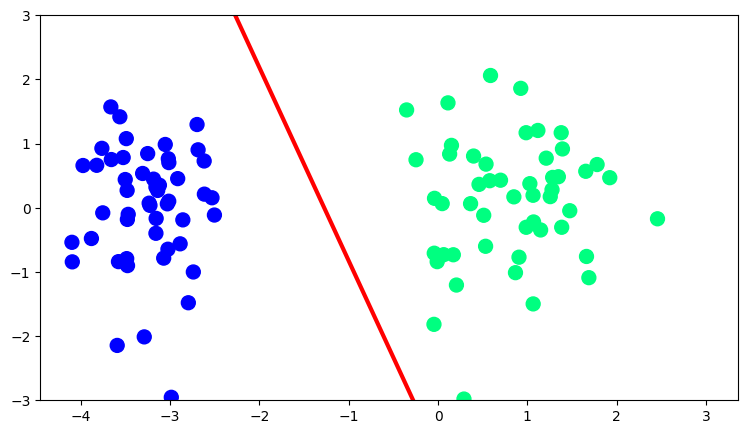

In [13]:
plt.figure(figsize=(9,5))
plt.plot(x_input,y_input,color='red',linewidth=3)
plt.scatter(X[:,0],X[:,1],c=y, cmap='winter',s=100)
plt.ylim(-3,3)
plt.show()

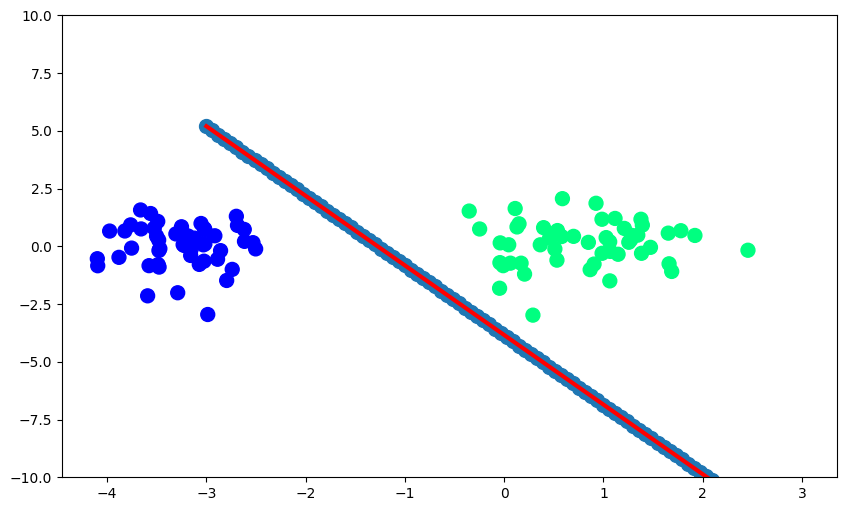

In [15]:
plt.figure(figsize=(10,6))
plt.plot(x_input,y_input,color='red',linewidth=3)
plt.scatter(X[:,0],X[:,1],c=y, cmap='winter',s=100)
plt.scatter(x_input,y_input,s=100)
plt.ylim(-10,10)
plt.show()

In [16]:
def perceptron(X,y):
  X=np.insert(X,0,1,axis=1)         #adding a column of 1's in X as 1st column
  weights=np.ones(X.shape[1])       #initializing weights to 1
  lr=0.1
  m=[]
  b=[]

  for i in range(200):
    j=np.random.randint(0,100)
    y_hat=step(np.dot(X[j],weights))

    weights=weights + lr*(y[j]-y_hat)*X[j]

    m.append(-weights[1]/weights[2])
    b.append(-weights[0]/weights[2])

  return m,b


In [17]:
m,b=perceptron(X,y)
print("m :",m,'\nb :',b)

m : [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.4660110465042502, -1.4660110465042502, -1.4660110465042502, -1.4660110465042502, -1.4660110465042502, -1.4660110465042502, -1.4660110465042502, -1.4660110465042502, -1.4660110465042502, -1.4660110465042502, -1.4660110465042502, -1.4660110465042502, -1.4660110465042502, -1.4660110465042502, -1.4660110465042502, -1.4660110465042502, -1.4660110465042502, -1.4660110465042502, -1.4660110465042502, -1.4660110465042502, -1.4660110465042502, -1.4660110465042502, -1.4660110465042502, -1.4660110465042502, -1.4660110465042502, -1.4660110465042502, -1.4660110465042502, -1.4660110465042502, -1.4660110465042502, -1.4660110465042502, -1.4660110465042502, -1.4660110465042502, -1.46601104650425

In [18]:
len(m), len(b)

(200, 200)

In [19]:
%matplotlib notebook
from matplotlib.animation import FuncAnimation
import matplotlib.animation as animation
from IPython.display import Image
from IPython.display import HTML

In [20]:
fig, ax=plt.subplots(figsize=(7,4))  #(figsize=(10,6))

x_i=np.arange(-3,3,0.1)
y_i=x_i*m[0] + b[0]

ax.scatter(X[:,0],X[:,1],c=y,cmap="winter",s=100)
line, =ax.plot(x_i,x_i*m[0] + b[0], 'r-',linewidth=3)

plt.ylim(-3,3)

def update(i):
  label="epoch {0}".format(i+1)
  line.set_ydata(x_i*m[i] + b[i])
  ax.set_xlabel(label)
  return line,

anim=FuncAnimation(fig,update, repeat=True, frames=200, interval=100)
HTML(anim.to_jshtml())  #anim.save('animation.gif', writer='pillow')
#Image(filename="animation.gif")

<IPython.core.display.Javascript object>

#I use the below these three animations to understand this animaion function in better way--

<IPython.core.display.Javascript object>

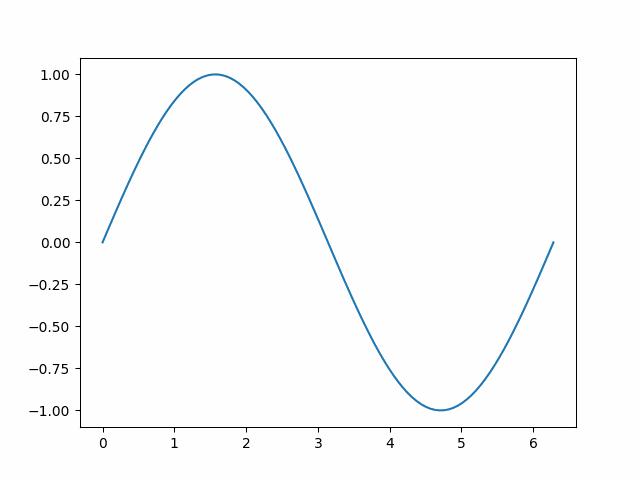

In [21]:
# Example function to update the plot
def update(frame):
    line.set_ydata(np.sin(x + frame / 10.0))  # Update the y-data of the line
    return line,

# Setup figure and plot
fig, ax = plt.subplots()
x = np.linspace(0, 2 * np.pi, 100)
line, = ax.plot(x, np.sin(x))

# Create the animation
ani = animation.FuncAnimation(fig, update, frames=100, interval=50)

# Save the animation as a GIF
ani.save('animation.gif', writer='Pillow')

# Display the GIF
Image(filename='animation.gif')


In [22]:
# Example function to update the plot
def update(frame):
    line.set_ydata(np.sin(x + frame / 10.0))  # Update the y-data of the line
    return line,

# Setup figure and plot
fig, ax = plt.subplots()
x = np.linspace(0, 2 * np.pi, 100)
line, = ax.plot(x, np.sin(x))   #line, is used to unpacking the value of ax.plot(x, np.sin(x))  which returns the list of line2D objects
                                #Basically list of line objets .here it returns list of 1 line2D objects so only one variable used to the left side.
# Create the animation
ani = animation.FuncAnimation(fig, update, frames=100, interval=50)

# Display the animation in the notebook
HTML(ani.to_jshtml())


<IPython.core.display.Javascript object>

##Understading lines = plt.plot(x, y1, x, y2, x, y3) :--

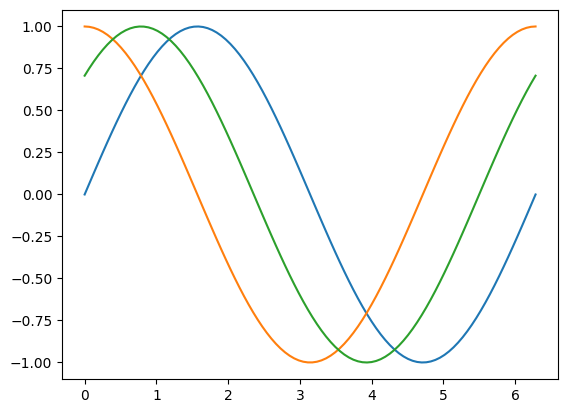

In [29]:
import numpy as np
import matplotlib.pyplot as plt

# Enable inline plotting in Jupyter Notebook or Colab
%matplotlib inline

# Define x values
x = np.linspace(0, 2 * np.pi, 100)

# Define multiple y values for different lines
y1 = np.sin(x)
y2 = np.cos(x)
y3 = np.sin(x + np.pi / 4)

# Plot multiple lines
lines = plt.plot(x, y1, x, y2, x, y3)

# Output the list of Line2D objects
# print(lines)

# Show the plot
plt.show()


In [24]:
fig, ax = plt.subplots()
xdata, ydata = [], []
ln, = ax.plot([], [], 'ro')

def init():
    ax.set_xlim(0, 2*np.pi)
    ax.set_ylim(-1, 1)
    return ln,

def update(frame):
    xdata.append(frame)
    ydata.append(np.sin(frame))
    ln.set_data(xdata, ydata)
    return ln,

ani = FuncAnimation(fig, update, frames=np.linspace(0, 2*np.pi, 128),
                    init_func=init, blit=True)
HTML(ani.to_jshtml())


<IPython.core.display.Javascript object>

In [30]:
from sklearn.linear_model import LogisticRegression
lor = LogisticRegression()
lor.fit(X,y)

LogisticRegression()

In [31]:
m = -(lor.coef_[0][0]/lor.coef_[0][1])
b = -(lor.intercept_/lor.coef_[0][1])

In [32]:
x_input1 = np.linspace(-3,3,100)
y_input1 = m*x_input + b

(-3.0, 2.0)

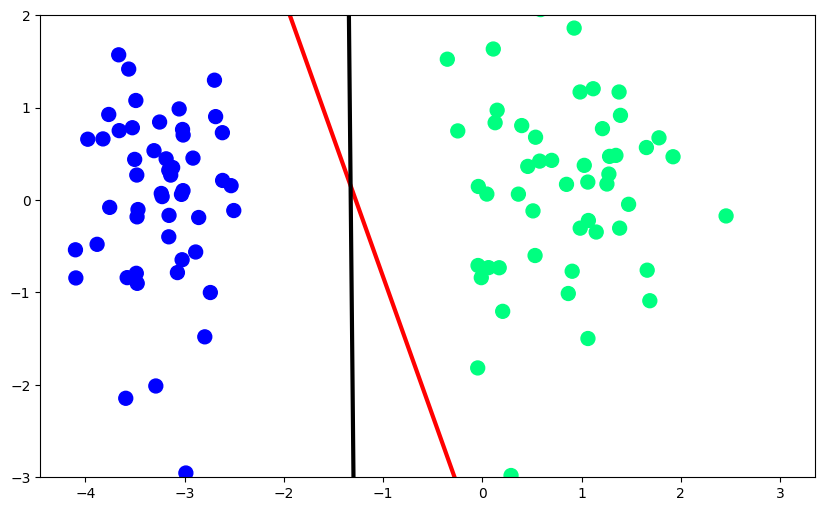

In [33]:
plt.figure(figsize=(10,6))
plt.plot(x_input,y_input,color='red',linewidth=3)
plt.plot(x_input1,y_input1,color='black',linewidth=3)
plt.scatter(X[:,0],X[:,1],c=y,cmap='winter',s=100)
plt.ylim(-3,2)

###We can here see that our sklearn LogisticRegression class cretes better classification line than our perceptron trick class.since it stop changing weights when encounter with correctly classified points due to step function used in perceptron_trick class which we will replace by sigmoid function and see wheather it perform same as sklearn LogisticRegression class or not..